In [1]:
import os, sys, time
import numpy as np
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import scanpy as sc
import spatialdata as sd
import squidpy as sq
from spatialdata_io import xenium
import matplotlib.pyplot as plt
import spatialdata_plot
import matplotlib.patches as patches
from spatialdata import bounding_box_query
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [2]:
folder = '/data2/xiaojiashun/niche/data/Xenium/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_outs'
celllabels = pd.read_csv(f'{folder}/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_cell_types.csv')
t0 = time.time()
sdata = xenium(
    path=str(folder),
    n_jobs=8,
    cell_boundaries=True,
    nucleus_boundaries=True,
    morphology_focus=True,
)
print(f'{time.time() - t0:.1f}s')
sdata

INFO     reading                                                                                                   
         /data2/xiaojiashun/niche/data/Xenium/Xenium_Prime_Human_Lymph_Node_Reactive_FFPE_outs/cell_feature_matrix.
         h5                                                                                                        
INFO     Transposing `data` of type: <class 'dask.array.core.Array'> to ('c', 'y', 'x').                           
61.4s


SpatialData object
├── Images
│     ├── 'he_image': DataTree[cyx] (3, 30987, 28915), (3, 15493, 14457), (3, 7746, 7228), (3, 3873, 3614), (3, 1936, 1807)
│     └── 'morphology_focus': DataTree[cyx] (5, 34119, 39776), (5, 17059, 19888), (5, 8529, 9944), (5, 4264, 4972), (5, 2132, 2486)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (34119, 39776), (17059, 19888), (8529, 9944), (4264, 4972), (2132, 2486)
│     └── 'nucleus_labels': DataTree[yx] (34119, 39776), (17059, 19888), (8529, 9944), (4264, 4972), (2132, 2486)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (708983, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (708983, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (702300, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (708983, 4624)
with coordinate systems:
    ▸ 'global', with elements:
        he_image (Images), morphology_focus (Images),

In [3]:
ad_sp = sdata.tables["table"].copy()
ad_sp.obs['x'] = ad_sp.obsm['spatial'][:,0]
ad_sp.obs['y'] = ad_sp.obsm['spatial'][:,1]
ad_sp.obs = ad_sp.obs.merge(celllabels,left_on='cell_id',right_on='cell_id',how='left')
print(ad_sp.obs.x.min(), ad_sp.obs.x.max(), ad_sp.obs.y.min(), ad_sp.obs.y.max())
ad_sp

31.891817092895508 8334.259765625 32.648372650146484 7243.1650390625


AnnData object with n_obs × n_vars = 708983 × 4624
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'x', 'y', 'group'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

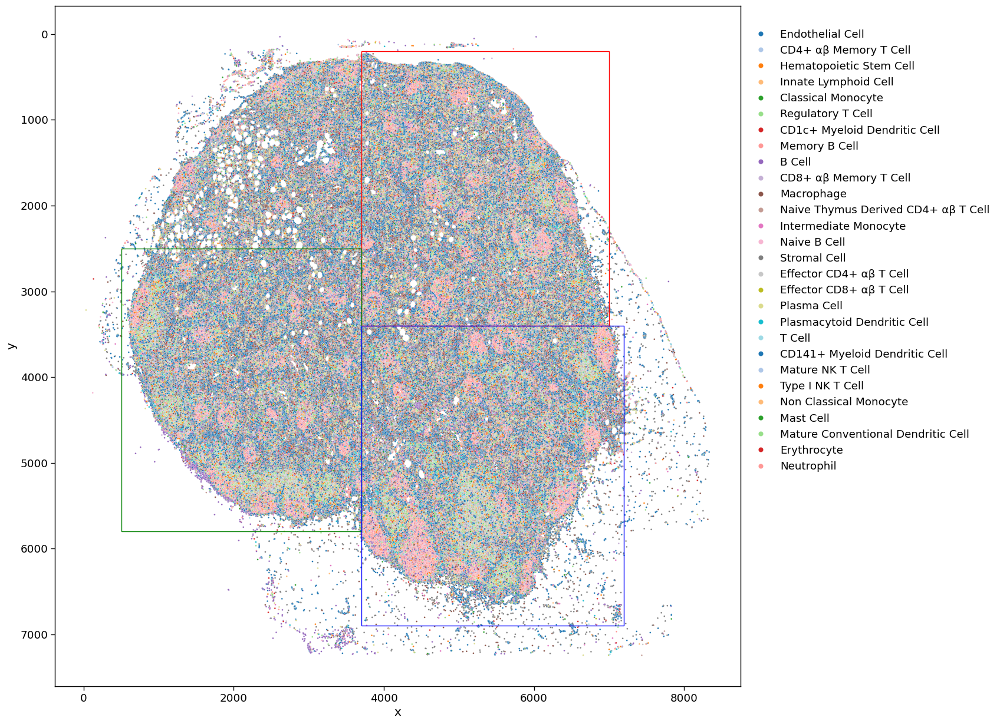

In [27]:
x1, y1, sx1, sy1 = 3700, 200, 3300, 3200
x2, y2, sx2, sy2 = 500, 2500, 3200, 3300
x3, y3, sx3, sy3 = 3700, 3400, 3500, 3500
sns.set_context('paper',font_scale=1.5)
fig, ax = plt.subplots(figsize=(15,15),dpi=100)
sns.scatterplot(data=ad_sp.obs, x="x", y="y", hue="group",s=4,palette='tab20',ax=ax)
plt.legend(bbox_to_anchor=(1.0,0.98), loc="upper left",framealpha=0,markerscale=3)
rect1 = patches.Rectangle((x1, y1), sx1, sy1, linewidth=1, edgecolor='r', facecolor='none')
rect2 = patches.Rectangle((x2, y2), sx2, sy2, linewidth=1, edgecolor='g', facecolor='none')
rect3 = patches.Rectangle((x3, y3), sx3, sy3, linewidth=1, edgecolor='b', facecolor='none')
# Add the patch to the Axes
ax.add_patch(rect1)
ax.add_patch(rect2)
ax.add_patch(rect3)
plt.gca().invert_yaxis()
plt.show()

In [28]:
## crop1
crop1 = ad_sp[
    (ad_sp.obsm["spatial"][:, 0] > x1) & (ad_sp.obsm["spatial"][:, 1] > y1)
    & (ad_sp.obsm["spatial"][:, 0] < x1+sx1) & (ad_sp.obsm["spatial"][:, 1] < y1+sy1), :
].copy()
crop1

AnnData object with n_obs × n_vars = 197644 × 4624
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'x', 'y', 'group'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [29]:
## crop2
crop2 = ad_sp[
    (ad_sp.obsm["spatial"][:, 0] > x2) & (ad_sp.obsm["spatial"][:, 1] > y2)
    & (ad_sp.obsm["spatial"][:, 0] < x2+sx2) & (ad_sp.obsm["spatial"][:, 1] < y2+sy2), :
].copy()
crop2

AnnData object with n_obs × n_vars = 192378 × 4624
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'x', 'y', 'group'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [30]:
## crop3
crop3 = ad_sp[
    (ad_sp.obsm["spatial"][:, 0] > x3) & (ad_sp.obsm["spatial"][:, 1] > y3)
    & (ad_sp.obsm["spatial"][:, 0] < x3+sx3) & (ad_sp.obsm["spatial"][:, 1] < y3+sy3), :
].copy()
crop3

AnnData object with n_obs × n_vars = 223757 × 4624
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'x', 'y', 'group'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

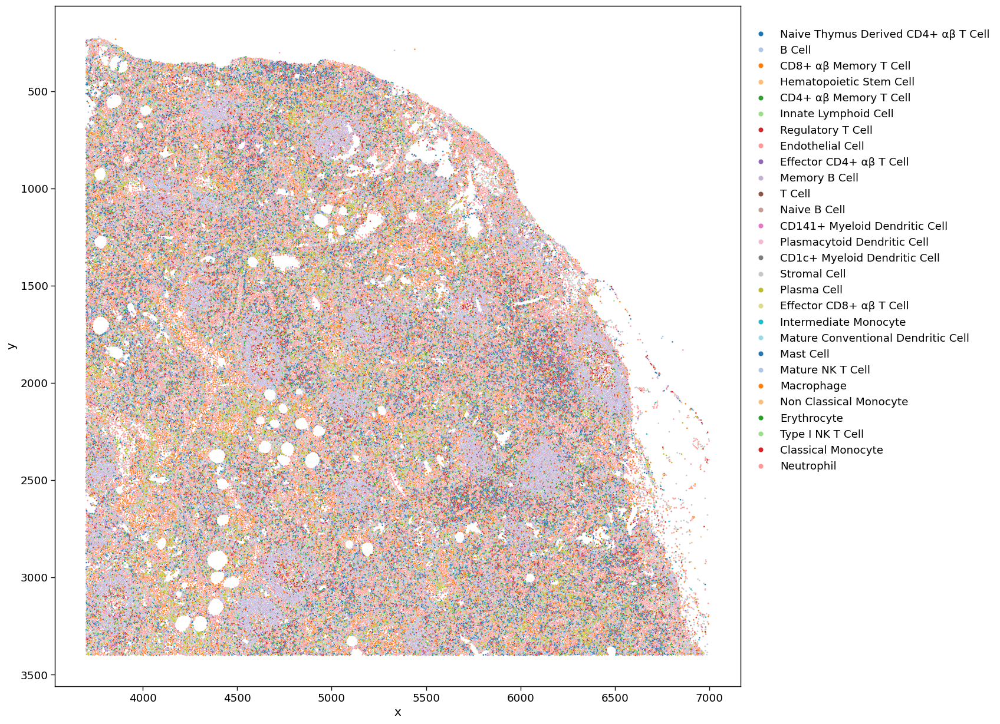

In [31]:
## crop1
sns.set_context('paper',font_scale=1.5)
plt.subplots(figsize=(15,15),dpi=100)
sns.scatterplot(data=crop1.obs, x="x", y="y", hue="group",s=4,palette='tab20')
plt.legend(bbox_to_anchor=(1.0,0.98), loc="upper left",framealpha=0,markerscale=3)
plt.gca().invert_yaxis()
plt.show()

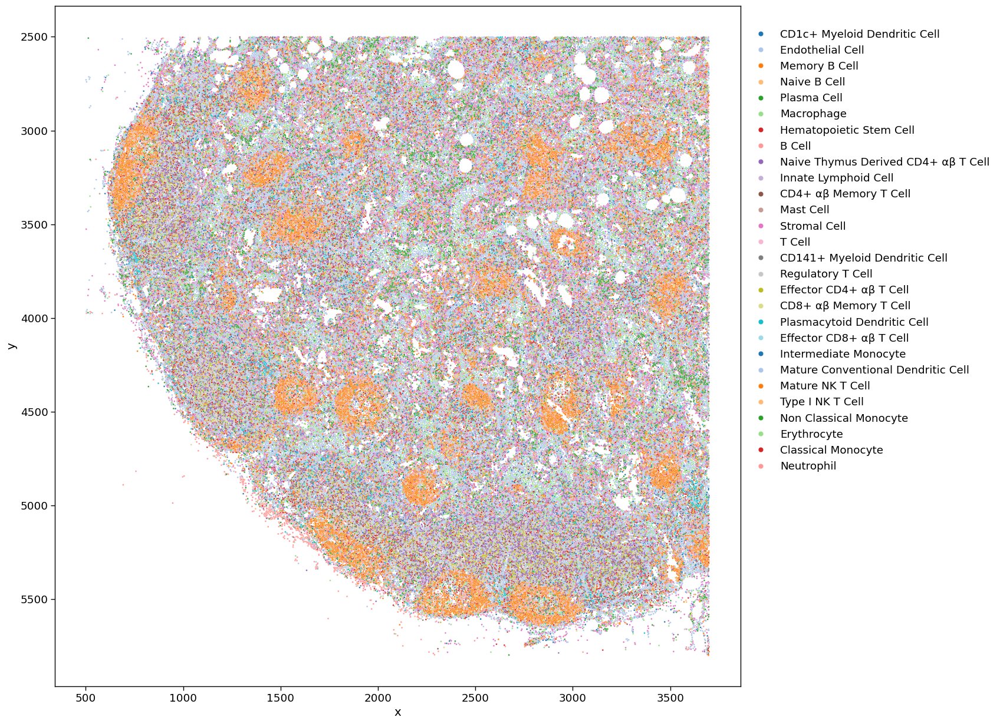

In [32]:
## crop2
sns.set_context('paper',font_scale=1.5)
plt.subplots(figsize=(15,15),dpi=100)
sns.scatterplot(data=crop2.obs, x="x", y="y", hue="group",s=4,palette='tab20')
plt.legend(bbox_to_anchor=(1.0,0.98), loc="upper left",framealpha=0,markerscale=3)
plt.gca().invert_yaxis()
plt.show()

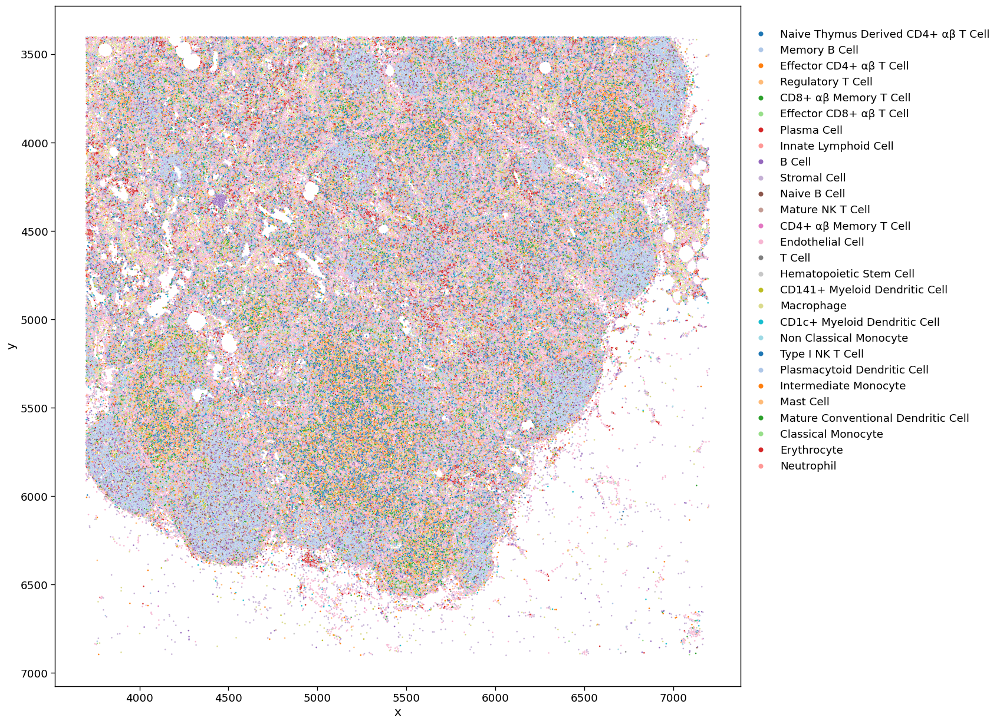

In [33]:
## crop3
sns.set_context('paper',font_scale=1.5)
plt.subplots(figsize=(15,15),dpi=100)
sns.scatterplot(data=crop3.obs, x="x", y="y", hue="group",s=4,palette='tab20')
plt.legend(bbox_to_anchor=(1.0,0.98), loc="upper left",framealpha=0,markerscale=3)
plt.gca().invert_yaxis()
plt.show()

In [34]:
## save raw data
save_dir = f'{folder}/three_crops'
os.makedirs(save_dir, exist_ok=True)
crop1.write(f'{save_dir}/crop1_raw.h5ad')
crop2.write(f'{save_dir}/crop2_raw.h5ad')
crop3.write(f'{save_dir}/crop3_raw.h5ad')